In [1]:
%matplotlib inline

import numpy as np
import copy
import matplotlib.pyplot as plt
import pickle
import random
import torch
from utils import torch_from_numpy
import datetime

from config import cfg_seed, cfg_env, cfg_z_dim, cfg_default_lr, cfg_default_early
seed = cfg_seed
env_str=cfg_env
default_lr=cfg_default_lr
default_early=cfg_default_early

from config import cfg_alpha
alpha=cfg_alpha

num_iter_max=200000

env_name = 'CustomPendulum-v0'
figfilenamehead = "fig_policy_evaluation_"+env_str+"_"

loss_list = []
normalized_loss_list = []

print("alpha",alpha)
print(datetime.datetime.now())

alpha 0.1
2023-06-07 08:17:36.143711


In [2]:
import gym
import custom_gym
env = gym.make(env_name)

random.seed(seed)
np.random.seed(seed)

env.seed(seed)
env.action_space.seed(seed)
torch.manual_seed(seed)


s_dim = env.reset().flatten().shape[0]
a_dim = env.action_space.sample().flatten().shape[0]
z_dim = cfg_z_dim
print(s_dim, a_dim, z_dim)



2 1 1


/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/core.py:329: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:174: UserWarning: WARN: Future gym versions will require that `Env.reset` can be passed a `seed` instead of using `Env.seed` for resetting the environment random number generator.
  logger.warn(
/home/proxima-hishinuma/anaconda3/

In [3]:


from sac import SAC
agent = SAC(env.observation_space.shape[0], env.action_space)
agent.load_checkpoint(ckpt_path="checkpoints/sac_checkpoint_custom_"+env_str+"_mdp_")


offline_data = pickle.load(open("offline_data_"+env_str+".pkl","rb"))
debug_info = pickle.load(open("offline_data_debug_info_"+env_str+".pkl","rb"))
debug_info = np.array(debug_info)

Loading models from checkpoints/sac_checkpoint_custom_pendulum_mdp_


In [4]:
args_init_dict = {
    "offline_data": offline_data,
    "s_dim": s_dim,
    "a_dim": a_dim,
    "z_dim": z_dim,
    #              "policy":agent.select_action,
    "mdp_policy":agent.policy.my_np_select_action,
    "bamdp_policy":None,
    "debug_info":debug_info,
    "env" : env,
    "ckpt_suffix" : env_str,
}
# import vi_base
# vi = vi_base.baseVI(args_init_dict)
import vi_iw
iwvi = vi_iw.iwVI(args_init_dict)

iwvi.load_base(ckpt_key="unweighted") # 重みなし学習結果だけをロード

dec: h_dim 48
base load ckpt ckpt_basevi_pendulum_unweighted
base load self.initial_belief.data.sum() tensor(-4.7245)
base load dec.state_dict()['net_phat.0.weight'].sum() tensor(1.8560)
penalty_target_min tensor(-5.5192) penalty_target_max tensor(11.0881)
train_loss:  -3.58523041510582
valid_loss:  -3.799707694149017
h_min_tilde -5.5192003 ell_tilde -3.6281258709144595 kappa_tilde 0.0007271862962146342


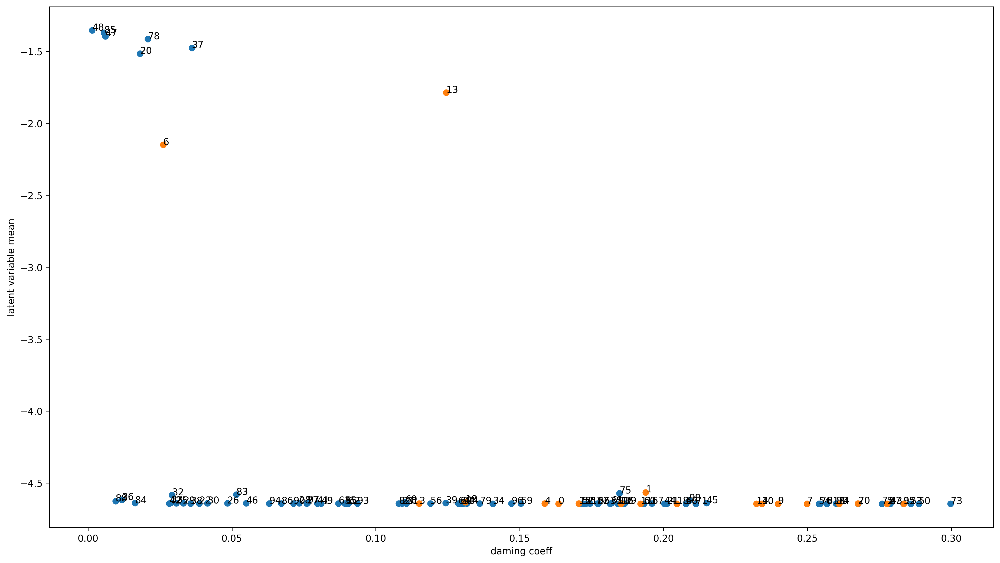

[0.16346495 0.19376823 0.2675319  0.11503246 0.15866848 0.27767899
 0.02613879 0.24978595 0.26100364 0.23974757]
[0.23415875 0.19197631 0.28340068 0.12439858 0.23227011 0.17053018
 0.18529065 0.1850802  0.20454609 0.13110959]
[0.01806764 0.20119136 0.03867789 0.10911323 0.13158045 0.03061344
 0.04839286 0.07598748 0.07332768 0.03311254]
[0.04145489 0.11061755 0.02913038 0.02882952 0.14059536 0.18145366
 0.01175634 0.03605897 0.03561832 0.1242789 ]
[0.20774164 0.07961685 0.02818215 0.27878886 0.20022311 0.21489816
 0.05495741 0.00603226 0.00140864 0.08100239]
[0.28865656 0.1728472  0.17167557 0.2858247  0.2539226  0.08923109
 0.11895172 0.17438186 0.20775948 0.15039731]
[0.19319706 0.18191796 0.09047245 0.08702328 0.12863061 0.0894847
 0.17726183 0.19596025 0.12942553 0.11026856]
[0.26757701 0.21116658 0.27584478 0.2996541  0.26043782 0.18466787
 0.25440247 0.17073022 0.0207501  0.1360628 ]
[0.2599147  0.256741   0.10799342 0.0514889  0.0163014  0.00555654
 0.06717741 0.27842439 0.00955

In [5]:
plt.figure(figsize=(18,10), dpi=250)
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()
plt.xlabel("daming coeff")
plt.ylabel("latent variable mean")

plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.xlim([-0.05,0.35])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter0.png")
plt.savefig(figfilenamehead+"damping_latent_iter0.eps")
# plt.savefig(figfilenamehead+"damping_latent_iter0.pdf")
plt.show()

for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [6]:
iwvi.get_real_rollout_mdppolicy_data()

0  1  

/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:227: DeprecationWarning: WARN: Core environment is written in old step API which returns one bool instead of two. It is recommended to rewrite the environment with new step API. 
  logger.deprecation(
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(done, (bool, np.bool8)):
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:141: UserWarning: WARN: The obs returned by the `step()` method was expecting numpy array dtype to be float32, actual type: float64
  logger.warn(
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:165: UserWarning: WARN: The obs returned by the `step()` method is not within the observ

2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   


In [7]:
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_data_fixlen()
# simdata0d = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_data_fixlen()
# simdata0e = copy.deepcopy(iwvi.simenv_rolloutdata)



0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  predict diverge [ 6.93475415 39.38510097] [ 1.27645856 22.65303947] [99.185135 20.      ] [49.592567 10.      ] sim_timestep 88
79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  predict diverge [ 9.15980467 20.63093801] [1.13595188 5.84039435] [99.185135 20.      ] [49.592567 10.      ] sim_timestep 149
38  39  40  41  42  43  44  45  46  47  predict diverge [ 7.90166158 26.72771572] [1.47866687 6.90654363] [99.185135 20.      ] [49.592567 10.      ] sim_timestep 66
48  predict diverge [11.54597494 21.65147768]

実環境方策rollout vs Sim環境方策rollout


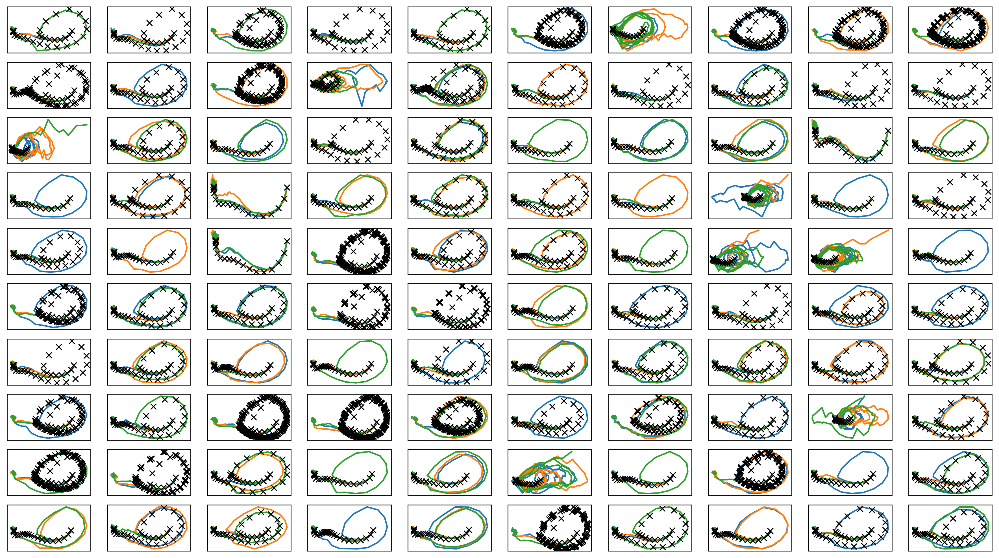

In [8]:
fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
    ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 
#     ax_list[-1].plot(simdata0d[i][:,0], simdata0d[i][:,1]) 
#     ax_list[-1].plot(simdata0e[i][:,0], simdata0e[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter0.png")
plt.savefig(figfilenamehead+"joint_iter0.eps")
# plt.savefig(figfilenamehead+"joint_iter0.pdf")

print("実環境方策rollout vs Sim環境方策rollout")

In [9]:
print(datetime.datetime.now())

2023-06-07 08:18:31.678676


# Iter 1

In [10]:
iwvi.get_sim_rollout_mdppolicy_data_randomstop()

0  1  2  3  4  5  6  7  8  9  10  11  12  13  predict diverge [26.48772071 64.96314595] [-1.51956346 80.94548034] [99.185135 20.      ] [49.592567 10.      ] sim_timestep 62
14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  predict diverge [ 8.52751579 20.07024904] [1.34427525 2.34738197] [99.185135 20.      ] [49.592567 10.      ] sim_timestep 73
38  39  40  41  42  43  44  45  46  47  predict diverge [  7.71951581 -22.33030497] [  1.39582067 -42.09796471] [99.185135 20.      ] [49.592567 10.      ] sim_timestep 6
predict diverge [ 9.45745533 29.68254534] [ 1.23020692 13.67002554] [99.185135 20.      ] [49.592567 10.      ] sim_timestep 78
48  predict diverge [  6.59390815 -21.80879256] [-1.14979616 -8.54890445] [99.185135 20.      ] [49.592567 10.      ] sim_timestep 38
predict diverge [ 4.58428304 22.93942302] [1.17557303 6.87169747] [99.185135 20.      ] [49.592567 10.      ] sim_timestep 98
49  50  51  52  53  54  55  56  57  58  59  6

In [11]:
iwvi.train_ratio(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, policy=agent.select_action)


train: iter 0  trainloss 1.22987  validloss 1.38492±0.00000  bestvalidloss 1.38492  last_update 0
train: iter 1  trainloss 0.83341  validloss 0.98101±0.00000  bestvalidloss 0.98101  last_update 0
train: iter 2  trainloss 0.71049  validloss 0.70489±0.00000  bestvalidloss 0.70489  last_update 0
train: iter 3  trainloss 0.67321  validloss 0.65635±0.00000  bestvalidloss 0.65635  last_update 0
train: iter 4  trainloss 0.63836  validloss 0.62665±0.00000  bestvalidloss 0.62665  last_update 0
train: iter 5  trainloss 0.60668  validloss 0.59394±0.00000  bestvalidloss 0.59394  last_update 0
train: iter 6  trainloss 0.57453  validloss 0.57116±0.00000  bestvalidloss 0.57116  last_update 0
train: iter 7  trainloss 0.53820  validloss 0.54986±0.00000  bestvalidloss 0.54986  last_update 0
train: iter 8  trainloss 0.50755  validloss 0.54326±0.00000  bestvalidloss 0.54326  last_update 0
train: iter 9  trainloss 0.48413  validloss 0.55073±0.00000  bestvalidloss 0.54326  last_update 1
train: iter 10  trai

train: iter 83  trainloss 0.23514  validloss 0.21588±0.00000  bestvalidloss 0.21588  last_update 0
train: iter 84  trainloss 0.23468  validloss 0.21705±0.00000  bestvalidloss 0.21588  last_update 1
train: iter 85  trainloss 0.23627  validloss 0.22645±0.00000  bestvalidloss 0.21588  last_update 2
train: iter 86  trainloss 0.23474  validloss 0.22258±0.00000  bestvalidloss 0.21588  last_update 3
train: iter 87  trainloss 0.23448  validloss 0.21977±0.00000  bestvalidloss 0.21588  last_update 4
train: iter 88  trainloss 0.23253  validloss 0.22142±0.00000  bestvalidloss 0.21588  last_update 5
train: iter 89  trainloss 0.23394  validloss 0.22301±0.00000  bestvalidloss 0.21588  last_update 6
train: iter 90  trainloss 0.23186  validloss 0.21651±0.00000  bestvalidloss 0.21588  last_update 7
train: iter 91  trainloss 0.23597  validloss 0.21275±0.00000  bestvalidloss 0.21275  last_update 0
train: iter 92  trainloss 0.23585  validloss 0.21245±0.00000  bestvalidloss 0.21245  last_update 0
train: ite

train: iter 166  trainloss 0.21332  validloss 0.20239±0.00000  bestvalidloss 0.20033  last_update 7
train: iter 167  trainloss 0.21535  validloss 0.20418±0.00000  bestvalidloss 0.20033  last_update 8
train: iter 168  trainloss 0.21450  validloss 0.20233±0.00000  bestvalidloss 0.20033  last_update 9
train: iter 169  trainloss 0.21328  validloss 0.20701±0.00000  bestvalidloss 0.20033  last_update 10
train: iter 170  trainloss 0.21352  validloss 0.20218±0.00000  bestvalidloss 0.20033  last_update 11
train: iter 171  trainloss 0.21242  validloss 0.19981±0.00000  bestvalidloss 0.19981  last_update 0
train: iter 172  trainloss 0.21355  validloss 0.20297±0.00000  bestvalidloss 0.19981  last_update 1
train: iter 173  trainloss 0.21277  validloss 0.20098±0.00000  bestvalidloss 0.19981  last_update 2
train: iter 174  trainloss 0.21597  validloss 0.20467±0.00000  bestvalidloss 0.19981  last_update 3
train: iter 175  trainloss 0.21265  validloss 0.20421±0.00000  bestvalidloss 0.19981  last_update 

train: iter 248  trainloss 0.20063  validloss 0.19426±0.00000  bestvalidloss 0.19001  last_update 1
train: iter 249  trainloss 0.20160  validloss 0.20319±0.00000  bestvalidloss 0.19001  last_update 2
train: iter 250  trainloss 0.20119  validloss 0.19500±0.00000  bestvalidloss 0.19001  last_update 3
train: iter 251  trainloss 0.20000  validloss 0.19301±0.00000  bestvalidloss 0.19001  last_update 4
train: iter 252  trainloss 0.19924  validloss 0.19471±0.00000  bestvalidloss 0.19001  last_update 5
train: iter 253  trainloss 0.20023  validloss 0.19959±0.00000  bestvalidloss 0.19001  last_update 6
train: iter 254  trainloss 0.20373  validloss 0.19869±0.00000  bestvalidloss 0.19001  last_update 7
train: iter 255  trainloss 0.20082  validloss 0.20506±0.00000  bestvalidloss 0.19001  last_update 8
train: iter 256  trainloss 0.20101  validloss 0.19167±0.00000  bestvalidloss 0.19001  last_update 9
train: iter 257  trainloss 0.19907  validloss 0.19018±0.00000  bestvalidloss 0.19001  last_update 10

train: iter 330  trainloss 0.19004  validloss 0.18472±0.00000  bestvalidloss 0.18177  last_update 11
train: iter 331  trainloss 0.19060  validloss 0.19318±0.00000  bestvalidloss 0.18177  last_update 12
train: iter 332  trainloss 0.19353  validloss 0.18309±0.00000  bestvalidloss 0.18177  last_update 13
train: iter 333  trainloss 0.18971  validloss 0.18455±0.00000  bestvalidloss 0.18177  last_update 14
train: iter 334  trainloss 0.19457  validloss 0.18546±0.00000  bestvalidloss 0.18177  last_update 15
train: iter 335  trainloss 0.19354  validloss 0.18717±0.00000  bestvalidloss 0.18177  last_update 16
train: iter 336  trainloss 0.19051  validloss 0.18355±0.00000  bestvalidloss 0.18177  last_update 17
train: iter 337  trainloss 0.19106  validloss 0.18660±0.00000  bestvalidloss 0.18177  last_update 18
train: iter 338  trainloss 0.18988  validloss 0.19406±0.00000  bestvalidloss 0.18177  last_update 19
train: iter 339  trainloss 0.18950  validloss 0.18925±0.00000  bestvalidloss 0.18177  last_

train: iter 412  trainloss 0.18806  validloss 0.19557±0.00000  bestvalidloss 0.17700  last_update 7
train: iter 413  trainloss 0.18324  validloss 0.17691±0.00000  bestvalidloss 0.17691  last_update 0
train: iter 414  trainloss 0.18278  validloss 0.18167±0.00000  bestvalidloss 0.17691  last_update 1
train: iter 415  trainloss 0.18567  validloss 0.17622±0.00000  bestvalidloss 0.17622  last_update 0
train: iter 416  trainloss 0.18359  validloss 0.19588±0.00000  bestvalidloss 0.17622  last_update 1
train: iter 417  trainloss 0.18282  validloss 0.18283±0.00000  bestvalidloss 0.17622  last_update 2
train: iter 418  trainloss 0.18461  validloss 0.19313±0.00000  bestvalidloss 0.17622  last_update 3
train: iter 419  trainloss 0.18696  validloss 0.17791±0.00000  bestvalidloss 0.17622  last_update 4
train: iter 420  trainloss 0.18424  validloss 0.18709±0.00000  bestvalidloss 0.17622  last_update 5
train: iter 421  trainloss 0.18104  validloss 0.17944±0.00000  bestvalidloss 0.17622  last_update 6


train: iter 494  trainloss 0.17799  validloss 0.17607±0.00000  bestvalidloss 0.17145  last_update 6
train: iter 495  trainloss 0.17802  validloss 0.17468±0.00000  bestvalidloss 0.17145  last_update 7
train: iter 496  trainloss 0.17743  validloss 0.18778±0.00000  bestvalidloss 0.17145  last_update 8
train: iter 497  trainloss 0.17814  validloss 0.18605±0.00000  bestvalidloss 0.17145  last_update 9
train: iter 498  trainloss 0.17496  validloss 0.17505±0.00000  bestvalidloss 0.17145  last_update 10
train: iter 499  trainloss 0.17692  validloss 0.18502±0.00000  bestvalidloss 0.17145  last_update 11
train: iter 500  trainloss 0.17772  validloss 0.17089±0.00000  bestvalidloss 0.17089  last_update 0
train: iter 501  trainloss 0.17827  validloss 0.17325±0.00000  bestvalidloss 0.17089  last_update 1
train: iter 502  trainloss 0.17704  validloss 0.17944±0.00000  bestvalidloss 0.17089  last_update 2
train: iter 503  trainloss 0.17688  validloss 0.18761±0.00000  bestvalidloss 0.17089  last_update 

train: iter 576  trainloss 0.17294  validloss 0.17183±0.00000  bestvalidloss 0.16844  last_update 14
train: iter 577  trainloss 0.17447  validloss 0.17376±0.00000  bestvalidloss 0.16844  last_update 15
train: iter 578  trainloss 0.17198  validloss 0.17319±0.00000  bestvalidloss 0.16844  last_update 16
train: iter 579  trainloss 0.17221  validloss 0.17200±0.00000  bestvalidloss 0.16844  last_update 17
train: iter 580  trainloss 0.17148  validloss 0.17472±0.00000  bestvalidloss 0.16844  last_update 18
train: iter 581  trainloss 0.17196  validloss 0.17325±0.00000  bestvalidloss 0.16844  last_update 19
train: iter 582  trainloss 0.17133  validloss 0.17498±0.00000  bestvalidloss 0.16844  last_update 20
train: iter 583  trainloss 0.17232  validloss 0.17325±0.00000  bestvalidloss 0.16844  last_update 21
train: iter 584  trainloss 0.16973  validloss 0.17496±0.00000  bestvalidloss 0.16844  last_update 22
train: iter 585  trainloss 0.17163  validloss 0.17198±0.00000  bestvalidloss 0.16844  last_

train: iter 658  trainloss 0.17086  validloss 0.17128±0.00000  bestvalidloss 0.16654  last_update 5
train: iter 659  trainloss 0.16819  validloss 0.16840±0.00000  bestvalidloss 0.16654  last_update 6
train: iter 660  trainloss 0.16963  validloss 0.17103±0.00000  bestvalidloss 0.16654  last_update 7
train: iter 661  trainloss 0.16728  validloss 0.17347±0.00000  bestvalidloss 0.16654  last_update 8
train: iter 662  trainloss 0.16874  validloss 0.16963±0.00000  bestvalidloss 0.16654  last_update 9
train: iter 663  trainloss 0.16622  validloss 0.17320±0.00000  bestvalidloss 0.16654  last_update 10
train: iter 664  trainloss 0.16741  validloss 0.17050±0.00000  bestvalidloss 0.16654  last_update 11
train: iter 665  trainloss 0.16713  validloss 0.16940±0.00000  bestvalidloss 0.16654  last_update 12
train: iter 666  trainloss 0.16807  validloss 0.17427±0.00000  bestvalidloss 0.16654  last_update 13
train: iter 667  trainloss 0.16611  validloss 0.17780±0.00000  bestvalidloss 0.16654  last_updat

train: iter 740  trainloss 0.16444  validloss 0.17274±0.00000  bestvalidloss 0.16480  last_update 7
train: iter 741  trainloss 0.16448  validloss 0.17009±0.00000  bestvalidloss 0.16480  last_update 8
train: iter 742  trainloss 0.16409  validloss 0.16906±0.00000  bestvalidloss 0.16480  last_update 9
train: iter 743  trainloss 0.16298  validloss 0.17136±0.00000  bestvalidloss 0.16480  last_update 10
train: iter 744  trainloss 0.16305  validloss 0.16527±0.00000  bestvalidloss 0.16480  last_update 11
train: iter 745  trainloss 0.16521  validloss 0.17099±0.00000  bestvalidloss 0.16480  last_update 12
train: iter 746  trainloss 0.16174  validloss 0.17104±0.00000  bestvalidloss 0.16480  last_update 13
train: iter 747  trainloss 0.16354  validloss 0.16799±0.00000  bestvalidloss 0.16480  last_update 14
train: iter 748  trainloss 0.16653  validloss 0.18112±0.00000  bestvalidloss 0.16480  last_update 15
train: iter 749  trainloss 0.16355  validloss 0.17578±0.00000  bestvalidloss 0.16480  last_upd

train: iter 822  trainloss 0.16052  validloss 0.16942±0.00000  bestvalidloss 0.16244  last_update 54
train: iter 823  trainloss 0.16083  validloss 0.16577±0.00000  bestvalidloss 0.16244  last_update 55
train: iter 824  trainloss 0.16016  validloss 0.17073±0.00000  bestvalidloss 0.16244  last_update 56
train: iter 825  trainloss 0.16142  validloss 0.16893±0.00000  bestvalidloss 0.16244  last_update 57
train: iter 826  trainloss 0.15873  validloss 0.17131±0.00000  bestvalidloss 0.16244  last_update 58
train: iter 827  trainloss 0.16154  validloss 0.16502±0.00000  bestvalidloss 0.16244  last_update 59
train: iter 828  trainloss 0.16070  validloss 0.16818±0.00000  bestvalidloss 0.16244  last_update 60
train: iter 829  trainloss 0.16182  validloss 0.17664±0.00000  bestvalidloss 0.16244  last_update 61
train: iter 830  trainloss 0.15920  validloss 0.16612±0.00000  bestvalidloss 0.16244  last_update 62
train: iter 831  trainloss 0.16054  validloss 0.16744±0.00000  bestvalidloss 0.16244  last_

([1.2298712112009524,
  0.8334131952375173,
  0.7104939304292202,
  0.6732079051434994,
  0.6383608814328909,
  0.6066841747611761,
  0.5745327275246381,
  0.5382036652415991,
  0.507551995664835,
  0.48413485791534183,
  0.4684816088527441,
  0.4535861998796463,
  0.44122726898640396,
  0.4294845947995782,
  0.42309669833630326,
  0.4091572552919388,
  0.4019574852660298,
  0.3899420268833637,
  0.37696443535387514,
  0.36716842371970415,
  0.3605300445109606,
  0.348441818729043,
  0.3373521097004414,
  0.32908120919018985,
  0.3234905067831278,
  0.3189345454797149,
  0.31427491176873446,
  0.30898997467011213,
  0.3048208164051175,
  0.29999162405729296,
  0.29899931643158195,
  0.29737387150526046,
  0.2936474453657866,
  0.2925825322046876,
  0.2880715194158256,
  0.28777305167168377,
  0.2813319657929242,
  0.2850949876010418,
  0.2783001923933625,
  0.28138259928673504,
  0.2755758177489042,
  0.2725472642108798,
  0.2720849740318954,
  0.27217378187924623,
  0.2684924285858869

In [12]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))
# print(loss_list)
# print(normalized_loss_list)

train_loss:  -0.41718457993715996
valid_loss:  -0.197598458480835
weight_alpha 1.0 h_min_tilde -5.5192003 ell_tilde -0.37326735564589497 kappa_tilde 0.00044082674729616333
train_loss:  -1.7838871622204777
valid_loss:  -1.799710102319717
weight_alpha 0.1 h_min_tilde -5.5192003 ell_tilde -1.7870517502403258 kappa_tilde 0.000517631310148103


1e-08 1000.0


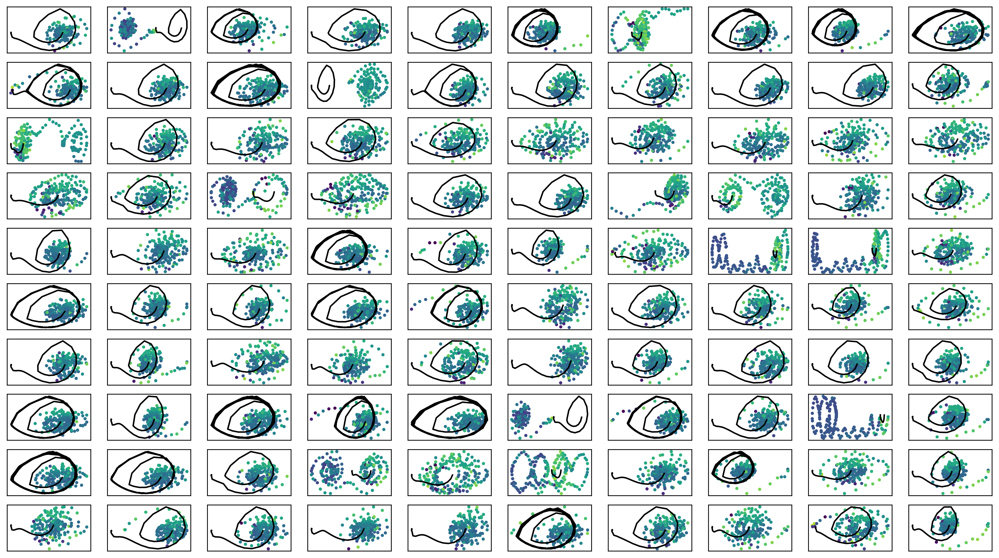

In [13]:

def f(x):
#     return x
    return np.log10(x)

fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter1.png")

In [14]:

train_curve1, valid_curve1 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()

# train_curve2, valid_curve2 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=2)
# iwvi.update_mulogvar_offlinedata()

# train_curve3, valid_curve3 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=3)
# iwvi.update_mulogvar_offlinedata()



weight_alpha 0.1
train_weighted_vae: enc_dec
train: iter 0  trainloss -352.45735  validloss -357.84173±0.00000  bestvalidloss -357.84173  last_update 0
train: iter 1  trainloss -357.35106  validloss -317.87364±0.00000  bestvalidloss -357.84173  last_update 1
train: iter 2  trainloss -334.40337  validloss -324.77273±0.00000  bestvalidloss -357.84173  last_update 2
train: iter 3  trainloss -361.56752  validloss -305.19637±0.00000  bestvalidloss -357.84173  last_update 3
train: iter 4  trainloss -361.35579  validloss -328.40872±0.00000  bestvalidloss -357.84173  last_update 4
train: iter 5  trainloss -358.67207  validloss -314.64692±0.00000  bestvalidloss -357.84173  last_update 5
train: iter 6  trainloss -364.49596  validloss -317.69082±0.00000  bestvalidloss -357.84173  last_update 6
train: iter 7  trainloss -365.28414  validloss -331.48965±0.00000  bestvalidloss -357.84173  last_update 7
train: iter 8  trainloss -365.36627  validloss -335.01947±0.00000  bestvalidloss -357.84173  last_u

train: iter 76  trainloss -416.35467  validloss -395.35512±0.00000  bestvalidloss -407.20044  last_update 8
train: iter 77  trainloss -412.23433  validloss -395.22771±0.00000  bestvalidloss -407.20044  last_update 9
train: iter 78  trainloss -405.32932  validloss -390.05936±0.00000  bestvalidloss -407.20044  last_update 10
train: iter 79  trainloss -411.56500  validloss -403.66403±0.00000  bestvalidloss -407.20044  last_update 11
train: iter 80  trainloss -412.60378  validloss -374.81822±0.00000  bestvalidloss -407.20044  last_update 12
train: iter 81  trainloss -414.26314  validloss -387.04745±0.00000  bestvalidloss -407.20044  last_update 13
train: iter 82  trainloss -424.35953  validloss -420.45515±0.00000  bestvalidloss -420.45515  last_update 0
train: iter 83  trainloss -426.04486  validloss -404.81323±0.00000  bestvalidloss -420.45515  last_update 1
train: iter 84  trainloss -422.06319  validloss -388.94980±0.00000  bestvalidloss -420.45515  last_update 2
train: iter 85  trainlos

train: iter 152  trainloss -464.07937  validloss -404.00025±0.00000  bestvalidloss -470.45477  last_update 13
train: iter 153  trainloss -461.39232  validloss -406.26768±0.00000  bestvalidloss -470.45477  last_update 14
train: iter 154  trainloss -453.33435  validloss -397.22019±0.00000  bestvalidloss -470.45477  last_update 15
train: iter 155  trainloss -468.17397  validloss -391.47836±0.00000  bestvalidloss -470.45477  last_update 16
train: iter 156  trainloss -463.44172  validloss -441.31761±0.00000  bestvalidloss -470.45477  last_update 17
train: iter 157  trainloss -452.66965  validloss -408.88973±0.00000  bestvalidloss -470.45477  last_update 18
train: iter 158  trainloss -462.59774  validloss -418.08356±0.00000  bestvalidloss -470.45477  last_update 19
train: iter 159  trainloss -461.42425  validloss -422.02343±0.00000  bestvalidloss -470.45477  last_update 20
train: iter 160  trainloss -466.40096  validloss -437.28046±0.00000  bestvalidloss -470.45477  last_update 21
train: ite

train: iter 227  trainloss -486.20500  validloss -442.41816±0.00000  bestvalidloss -493.46021  last_update 39
train: iter 228  trainloss -487.95493  validloss -433.19529±0.00000  bestvalidloss -493.46021  last_update 40
train: iter 229  trainloss -492.45506  validloss -489.95361±0.00000  bestvalidloss -493.46021  last_update 41
train: iter 230  trainloss -483.57640  validloss -400.95070±0.00000  bestvalidloss -493.46021  last_update 42
train: iter 231  trainloss -489.98385  validloss -471.49627±0.00000  bestvalidloss -493.46021  last_update 43
train: iter 232  trainloss -502.68871  validloss -503.99716±0.00000  bestvalidloss -503.99716  last_update 0
train: iter 233  trainloss -495.73485  validloss -466.22769±0.00000  bestvalidloss -503.99716  last_update 1
train: iter 234  trainloss -497.21635  validloss -443.37197±0.00000  bestvalidloss -503.99716  last_update 2
train: iter 235  trainloss -488.78602  validloss -485.50720±0.00000  bestvalidloss -503.99716  last_update 3
train: iter 23

train: iter 302  trainloss -513.53734  validloss -513.15397±0.00000  bestvalidloss -532.67262  last_update 9
train: iter 303  trainloss -515.76686  validloss -521.80495±0.00000  bestvalidloss -532.67262  last_update 10
train: iter 304  trainloss -521.23834  validloss -530.58837±0.00000  bestvalidloss -532.67262  last_update 11
train: iter 305  trainloss -505.02086  validloss -482.47784±0.00000  bestvalidloss -532.67262  last_update 12
train: iter 306  trainloss -523.99208  validloss -501.92598±0.00000  bestvalidloss -532.67262  last_update 13
train: iter 307  trainloss -507.61442  validloss -488.93237±0.00000  bestvalidloss -532.67262  last_update 14
train: iter 308  trainloss -522.35798  validloss -461.76548±0.00000  bestvalidloss -532.67262  last_update 15
train: iter 309  trainloss -523.00283  validloss -501.10833±0.00000  bestvalidloss -532.67262  last_update 16
train: iter 310  trainloss -514.69129  validloss -505.21502±0.00000  bestvalidloss -532.67262  last_update 17
train: iter

train: iter 377  trainloss -537.97905  validloss -527.67794±0.00000  bestvalidloss -558.97114  last_update 14
train: iter 378  trainloss -543.09139  validloss -548.61078±0.00000  bestvalidloss -558.97114  last_update 15
train: iter 379  trainloss -544.12972  validloss -494.85770±0.00000  bestvalidloss -558.97114  last_update 16
train: iter 380  trainloss -529.02682  validloss -560.45502±0.00000  bestvalidloss -560.45502  last_update 0
train: iter 381  trainloss -548.46001  validloss -546.90343±0.00000  bestvalidloss -560.45502  last_update 1
train: iter 382  trainloss -540.99748  validloss -553.59194±0.00000  bestvalidloss -560.45502  last_update 2
train: iter 383  trainloss -540.02593  validloss -549.66294±0.00000  bestvalidloss -560.45502  last_update 3
train: iter 384  trainloss -525.83060  validloss -543.73870±0.00000  bestvalidloss -560.45502  last_update 4
train: iter 385  trainloss -542.17814  validloss -544.49637±0.00000  bestvalidloss -560.45502  last_update 5
train: iter 386 

train: iter 452  trainloss -551.14687  validloss -502.29141±0.00000  bestvalidloss -591.99917  last_update 7
train: iter 453  trainloss -553.23338  validloss -577.80118±0.00000  bestvalidloss -591.99917  last_update 8
train: iter 454  trainloss -546.85835  validloss -509.54028±0.00000  bestvalidloss -591.99917  last_update 9
train: iter 455  trainloss -564.50969  validloss -546.38741±0.00000  bestvalidloss -591.99917  last_update 10
train: iter 456  trainloss -559.88715  validloss -528.08434±0.00000  bestvalidloss -591.99917  last_update 11
train: iter 457  trainloss -560.04165  validloss -561.18901±0.00000  bestvalidloss -591.99917  last_update 12
train: iter 458  trainloss -557.95393  validloss -576.67634±0.00000  bestvalidloss -591.99917  last_update 13
train: iter 459  trainloss -556.42582  validloss -533.82834±0.00000  bestvalidloss -591.99917  last_update 14
train: iter 460  trainloss -557.81651  validloss -547.80991±0.00000  bestvalidloss -591.99917  last_update 15
train: iter 4

train: iter 527  trainloss -575.76281  validloss -603.83820±0.00000  bestvalidloss -604.92285  last_update 13
train: iter 528  trainloss -575.07847  validloss -509.83862±0.00000  bestvalidloss -604.92285  last_update 14
train: iter 529  trainloss -577.59060  validloss -581.84129±0.00000  bestvalidloss -604.92285  last_update 15
train: iter 530  trainloss -569.28835  validloss -583.69845±0.00000  bestvalidloss -604.92285  last_update 16
train: iter 531  trainloss -566.70830  validloss -574.76481±0.00000  bestvalidloss -604.92285  last_update 17
train: iter 532  trainloss -572.98608  validloss -591.07424±0.00000  bestvalidloss -604.92285  last_update 18
train: iter 533  trainloss -574.98848  validloss -551.03079±0.00000  bestvalidloss -604.92285  last_update 19
train: iter 534  trainloss -573.42981  validloss -555.29428±0.00000  bestvalidloss -604.92285  last_update 20
train: iter 535  trainloss -571.07681  validloss -578.11307±0.00000  bestvalidloss -604.92285  last_update 21
train: ite

train: iter 602  trainloss -576.07385  validloss -610.54343±0.00000  bestvalidloss -617.68522  last_update 24
train: iter 603  trainloss -587.39053  validloss -595.15388±0.00000  bestvalidloss -617.68522  last_update 25
train: iter 604  trainloss -588.99210  validloss -600.69070±0.00000  bestvalidloss -617.68522  last_update 26
train: iter 605  trainloss -584.54589  validloss -589.85824±0.00000  bestvalidloss -617.68522  last_update 27
train: iter 606  trainloss -573.03654  validloss -568.00703±0.00000  bestvalidloss -617.68522  last_update 28
train: iter 607  trainloss -571.43902  validloss -587.33918±0.00000  bestvalidloss -617.68522  last_update 29
train: iter 608  trainloss -590.33335  validloss -604.90771±0.00000  bestvalidloss -617.68522  last_update 30
train: iter 609  trainloss -595.40347  validloss -581.83521±0.00000  bestvalidloss -617.68522  last_update 31
train: iter 610  trainloss -593.10530  validloss -569.92969±0.00000  bestvalidloss -617.68522  last_update 32
train: ite

train: iter 677  trainloss -548.29859  validloss -564.44640±0.00000  bestvalidloss -639.09993  last_update 11
train: iter 678  trainloss -590.70437  validloss -603.55213±0.00000  bestvalidloss -639.09993  last_update 12
train: iter 679  trainloss -598.24216  validloss -592.18641±0.00000  bestvalidloss -639.09993  last_update 13
train: iter 680  trainloss -603.56553  validloss -633.19962±0.00000  bestvalidloss -639.09993  last_update 14
train: iter 681  trainloss -600.13276  validloss -572.37320±0.00000  bestvalidloss -639.09993  last_update 15
train: iter 682  trainloss -597.45201  validloss -631.94891±0.00000  bestvalidloss -639.09993  last_update 16
train: iter 683  trainloss -602.36350  validloss -613.61417±0.00000  bestvalidloss -639.09993  last_update 17
train: iter 684  trainloss -603.46142  validloss -602.12830±0.00000  bestvalidloss -639.09993  last_update 18
train: iter 685  trainloss -594.73775  validloss -607.62240±0.00000  bestvalidloss -639.09993  last_update 19
train: ite

train: iter 752  trainloss -608.80372  validloss -623.92328±0.00000  bestvalidloss -642.09976  last_update 2
train: iter 753  trainloss -610.38376  validloss -615.08575±0.00000  bestvalidloss -642.09976  last_update 3
train: iter 754  trainloss -607.33289  validloss -616.46260±0.00000  bestvalidloss -642.09976  last_update 4
train: iter 755  trainloss -600.84273  validloss -586.73747±0.00000  bestvalidloss -642.09976  last_update 5
train: iter 756  trainloss -600.19460  validloss -609.27361±0.00000  bestvalidloss -642.09976  last_update 6
train: iter 757  trainloss -596.86124  validloss -594.88603±0.00000  bestvalidloss -642.09976  last_update 7
train: iter 758  trainloss -605.22216  validloss -626.80911±0.00000  bestvalidloss -642.09976  last_update 8
train: iter 759  trainloss -610.41545  validloss -634.41121±0.00000  bestvalidloss -642.09976  last_update 9
train: iter 760  trainloss -603.56449  validloss -545.66877±0.00000  bestvalidloss -642.09976  last_update 10
train: iter 761  t

train: iter 827  trainloss -610.10430  validloss -634.21052±0.00000  bestvalidloss -646.92505  last_update 64
train: iter 828  trainloss -615.00813  validloss -635.65227±0.00000  bestvalidloss -646.92505  last_update 65
train: iter 829  trainloss -610.03400  validloss -631.77236±0.00000  bestvalidloss -646.92505  last_update 66
train: iter 830  trainloss -611.71420  validloss -654.60694±0.00000  bestvalidloss -654.60694  last_update 0
train: iter 831  trainloss -593.89216  validloss -605.64534±0.00000  bestvalidloss -654.60694  last_update 1
train: iter 832  trainloss -614.42784  validloss -594.89795±0.00000  bestvalidloss -654.60694  last_update 2
train: iter 833  trainloss -615.67686  validloss -635.73417±0.00000  bestvalidloss -654.60694  last_update 3
train: iter 834  trainloss -609.10479  validloss -622.30310±0.00000  bestvalidloss -654.60694  last_update 4
train: iter 835  trainloss -612.45835  validloss -617.96985±0.00000  bestvalidloss -654.60694  last_update 5
train: iter 836 

train: iter 902  trainloss -611.44153  validloss -618.55498±0.00000  bestvalidloss -657.75981  last_update 63
train: iter 903  trainloss -618.16409  validloss -618.70105±0.00000  bestvalidloss -657.75981  last_update 64
train: iter 904  trainloss -614.85870  validloss -645.16349±0.00000  bestvalidloss -657.75981  last_update 65
train: iter 905  trainloss -621.32438  validloss -632.78568±0.00000  bestvalidloss -657.75981  last_update 66
train: iter 906  trainloss -614.77725  validloss -628.07498±0.00000  bestvalidloss -657.75981  last_update 67
train: iter 907  trainloss -619.62256  validloss -638.70769±0.00000  bestvalidloss -657.75981  last_update 68
train: iter 908  trainloss -614.86570  validloss -646.95070±0.00000  bestvalidloss -657.75981  last_update 69
train: iter 909  trainloss -621.47015  validloss -625.10531±0.00000  bestvalidloss -657.75981  last_update 70
train: iter 910  trainloss -602.49259  validloss -612.75471±0.00000  bestvalidloss -657.75981  last_update 71
train: ite

train: iter 977  trainloss -622.82938  validloss -628.10018±0.00000  bestvalidloss -666.92161  last_update 9
train: iter 978  trainloss -616.94357  validloss -649.80024±0.00000  bestvalidloss -666.92161  last_update 10
train: iter 979  trainloss -622.03818  validloss -623.79005±0.00000  bestvalidloss -666.92161  last_update 11
train: iter 980  trainloss -602.19077  validloss -642.78935±0.00000  bestvalidloss -666.92161  last_update 12
train: iter 981  trainloss -619.61075  validloss -640.76332±0.00000  bestvalidloss -666.92161  last_update 13
train: iter 982  trainloss -619.12944  validloss -654.65051±0.00000  bestvalidloss -666.92161  last_update 14
train: iter 983  trainloss -622.96389  validloss -642.68860±0.00000  bestvalidloss -666.92161  last_update 15
train: iter 984  trainloss -617.99507  validloss -643.38641±0.00000  bestvalidloss -666.92161  last_update 16
train: iter 985  trainloss -614.59987  validloss -612.34020±0.00000  bestvalidloss -666.92161  last_update 17
train: iter

train: iter 1052  trainloss -631.17037  validloss -648.57887±0.00000  bestvalidloss -674.98996  last_update 39
train: iter 1053  trainloss -618.74433  validloss -656.44441±0.00000  bestvalidloss -674.98996  last_update 40
train: iter 1054  trainloss -613.30449  validloss -636.39927±0.00000  bestvalidloss -674.98996  last_update 41
train: iter 1055  trainloss -617.04596  validloss -644.46299±0.00000  bestvalidloss -674.98996  last_update 42
train: iter 1056  trainloss -622.60711  validloss -600.48092±0.00000  bestvalidloss -674.98996  last_update 43
train: iter 1057  trainloss -630.63856  validloss -617.79950±0.00000  bestvalidloss -674.98996  last_update 44
train: iter 1058  trainloss -621.51633  validloss -610.47678±0.00000  bestvalidloss -674.98996  last_update 45
train: iter 1059  trainloss -626.00780  validloss -644.78353±0.00000  bestvalidloss -674.98996  last_update 46
train: iter 1060  trainloss -626.90194  validloss -643.43658±0.00000  bestvalidloss -674.98996  last_update 47
t

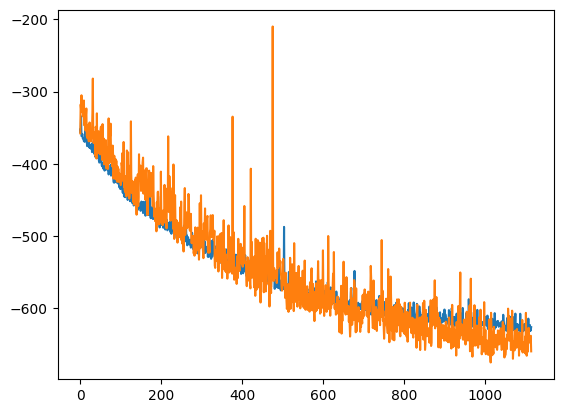

alpha 0.1 default_lr 0.0005


In [15]:
plt.plot(train_curve1)
plt.plot(valid_curve1)
plt.show()

# plt.plot(train_curve2)
# plt.plot(valid_curve2)
# plt.show()

# plt.plot(train_curve3)
# plt.plot(valid_curve3)
# plt.show()
print("alpha",alpha, "default_lr", default_lr)

In [16]:
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_data_fixlen()
# simdata0d = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_data_fixlen()
# simdata0e = copy.deepcopy(iwvi.simenv_rolloutdata)



0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56

実環境方策rollout vs Sim環境方策rollout


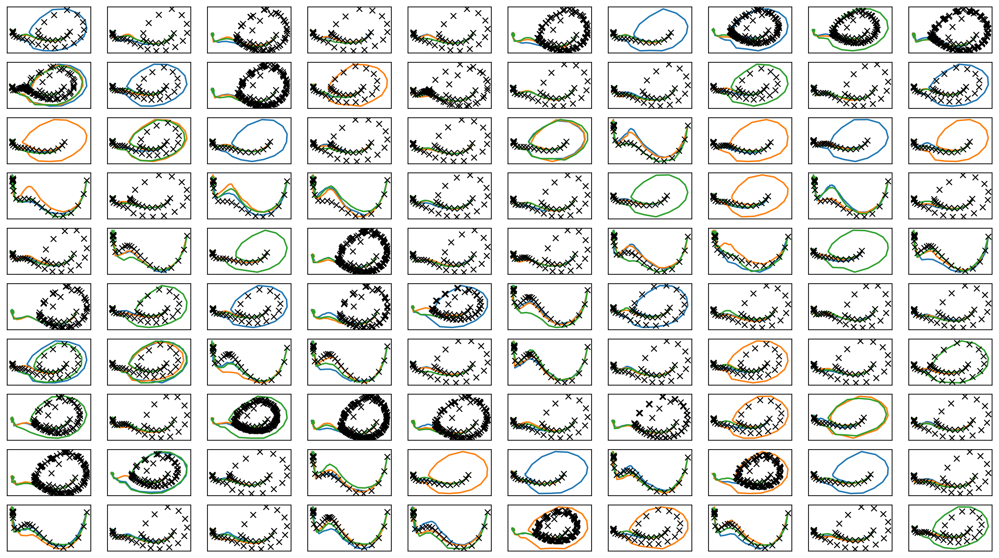

In [17]:
fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
    ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 
#     ax_list[-1].plot(simdata0d[i][:,0], simdata0d[i][:,1]) 
#     ax_list[-1].plot(simdata0e[i][:,0], simdata0e[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter1.png")
plt.savefig(figfilenamehead+"joint_iter1.eps")
# plt.savefig(figfilenamehead+"joint_iter1.pdf")
print("実環境方策rollout vs Sim環境方策rollout")

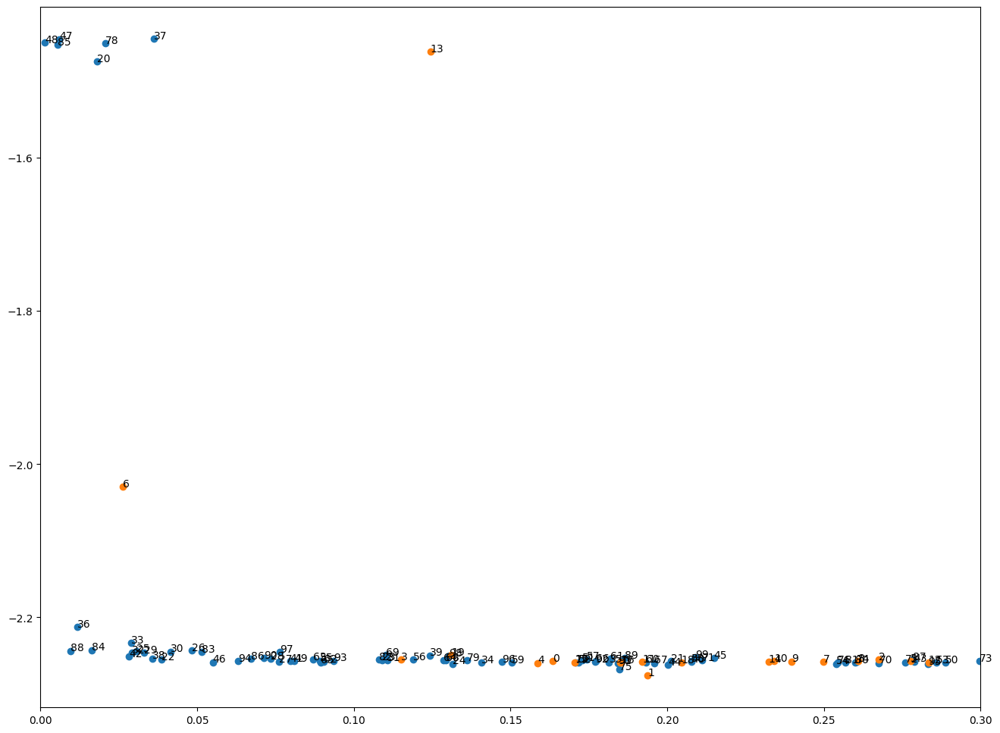

[0.16346495 0.19376823 0.2675319  0.11503246 0.15866848 0.27767899
 0.02613879 0.24978595 0.26100364 0.23974757]
[0.23415875 0.19197631 0.28340068 0.12439858 0.23227011 0.17053018
 0.18529065 0.1850802  0.20454609 0.13110959]
[0.01806764 0.20119136 0.03867789 0.10911323 0.13158045 0.03061344
 0.04839286 0.07598748 0.07332768 0.03311254]
[0.04145489 0.11061755 0.02913038 0.02882952 0.14059536 0.18145366
 0.01175634 0.03605897 0.03561832 0.1242789 ]
[0.20774164 0.07961685 0.02818215 0.27878886 0.20022311 0.21489816
 0.05495741 0.00603226 0.00140864 0.08100239]
[0.28865656 0.1728472  0.17167557 0.2858247  0.2539226  0.08923109
 0.11895172 0.17438186 0.20775948 0.15039731]
[0.19319706 0.18191796 0.09047245 0.08702328 0.12863061 0.0894847
 0.17726183 0.19596025 0.12942553 0.11026856]
[0.26757701 0.21116658 0.27584478 0.2996541  0.26043782 0.18466787
 0.25440247 0.17073022 0.0207501  0.1360628 ]
[0.2599147  0.256741   0.10799342 0.0514889  0.0163014  0.00555654
 0.06717741 0.27842439 0.00955

In [18]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter1.png")
plt.savefig(figfilenamehead+"damping_latent_iter1.eps")
# plt.savefig(figfilenamehead+"damping_latent_iter1.pdf")
plt.show()



for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [19]:
print(datetime.datetime.now())

2023-06-07 08:34:12.943566


# Iter2

In [20]:
iwvi.get_sim_rollout_mdppolicy_data_randomstop()

0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   


In [21]:
iwvi.train_ratio(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, policy=agent.select_action)


train: iter 0  trainloss 0.20493  validloss 0.46444±0.00000  bestvalidloss 0.46444  last_update 0
train: iter 1  trainloss 0.16932  validloss 0.14492±0.00000  bestvalidloss 0.14492  last_update 0
train: iter 2  trainloss 0.16677  validloss 0.14498±0.00000  bestvalidloss 0.14492  last_update 1
train: iter 3  trainloss 0.16272  validloss 0.13874±0.00000  bestvalidloss 0.13874  last_update 0
train: iter 4  trainloss 0.16088  validloss 0.14272±0.00000  bestvalidloss 0.13874  last_update 1
train: iter 5  trainloss 0.16197  validloss 0.14068±0.00000  bestvalidloss 0.13874  last_update 2
train: iter 6  trainloss 0.16193  validloss 0.13303±0.00000  bestvalidloss 0.13303  last_update 0
train: iter 7  trainloss 0.15698  validloss 0.13122±0.00000  bestvalidloss 0.13122  last_update 0
train: iter 8  trainloss 0.15875  validloss 0.13314±0.00000  bestvalidloss 0.13122  last_update 1
train: iter 9  trainloss 0.15699  validloss 0.13510±0.00000  bestvalidloss 0.13122  last_update 2
train: iter 10  trai

train: iter 83  trainloss 0.14500  validloss 0.12401±0.00000  bestvalidloss 0.12399  last_update 22
train: iter 84  trainloss 0.14701  validloss 0.12839±0.00000  bestvalidloss 0.12399  last_update 23
train: iter 85  trainloss 0.14601  validloss 0.12418±0.00000  bestvalidloss 0.12399  last_update 24
train: iter 86  trainloss 0.14428  validloss 0.12529±0.00000  bestvalidloss 0.12399  last_update 25
train: iter 87  trainloss 0.14551  validloss 0.12761±0.00000  bestvalidloss 0.12399  last_update 26
train: iter 88  trainloss 0.14782  validloss 0.12513±0.00000  bestvalidloss 0.12399  last_update 27
train: iter 89  trainloss 0.14522  validloss 0.12663±0.00000  bestvalidloss 0.12399  last_update 28
train: iter 90  trainloss 0.14506  validloss 0.12476±0.00000  bestvalidloss 0.12399  last_update 29
train: iter 91  trainloss 0.14456  validloss 0.12780±0.00000  bestvalidloss 0.12399  last_update 30
train: iter 92  trainloss 0.14530  validloss 0.12797±0.00000  bestvalidloss 0.12399  last_update 31


train: iter 165  trainloss 0.14097  validloss 0.12359±0.00000  bestvalidloss 0.12235  last_update 8
train: iter 166  trainloss 0.14165  validloss 0.13042±0.00000  bestvalidloss 0.12235  last_update 9
train: iter 167  trainloss 0.14289  validloss 0.12829±0.00000  bestvalidloss 0.12235  last_update 10
train: iter 168  trainloss 0.14063  validloss 0.12496±0.00000  bestvalidloss 0.12235  last_update 11
train: iter 169  trainloss 0.14160  validloss 0.12658±0.00000  bestvalidloss 0.12235  last_update 12
train: iter 170  trainloss 0.14279  validloss 0.12847±0.00000  bestvalidloss 0.12235  last_update 13
train: iter 171  trainloss 0.14337  validloss 0.12668±0.00000  bestvalidloss 0.12235  last_update 14
train: iter 172  trainloss 0.14180  validloss 0.12542±0.00000  bestvalidloss 0.12235  last_update 15
train: iter 173  trainloss 0.14247  validloss 0.13152±0.00000  bestvalidloss 0.12235  last_update 16
train: iter 174  trainloss 0.14228  validloss 0.13339±0.00000  bestvalidloss 0.12235  last_up

train: iter 247  trainloss 0.13873  validloss 0.12656±0.00000  bestvalidloss 0.12235  last_update 90
train: iter 248  trainloss 0.14019  validloss 0.12273±0.00000  bestvalidloss 0.12235  last_update 91
train: iter 249  trainloss 0.14372  validloss 0.12971±0.00000  bestvalidloss 0.12235  last_update 92
train: iter 250  trainloss 0.13934  validloss 0.12764±0.00000  bestvalidloss 0.12235  last_update 93
train: iter 251  trainloss 0.14094  validloss 0.12978±0.00000  bestvalidloss 0.12235  last_update 94
train: iter 252  trainloss 0.14118  validloss 0.13206±0.00000  bestvalidloss 0.12235  last_update 95
train: iter 253  trainloss 0.14082  validloss 0.12964±0.00000  bestvalidloss 0.12235  last_update 96
train: iter 254  trainloss 0.13951  validloss 0.12519±0.00000  bestvalidloss 0.12235  last_update 97
train: iter 255  trainloss 0.13945  validloss 0.12241±0.00000  bestvalidloss 0.12235  last_update 98
train: iter 256  trainloss 0.13937  validloss 0.12946±0.00000  bestvalidloss 0.12235  last_

([0.20492666447535157,
  0.16932383188977837,
  0.16676626773551106,
  0.16272383029572665,
  0.1608789199963212,
  0.1619738459121436,
  0.16192715289071202,
  0.15698075154796243,
  0.15874988762661815,
  0.15699207074940205,
  0.15751079488545655,
  0.1594424308743328,
  0.15673237582668662,
  0.15578047996386885,
  0.15438921032473446,
  0.15348793393932283,
  0.15450146663933992,
  0.15444295341148973,
  0.1548208330757916,
  0.15346441227011381,
  0.15383435618132352,
  0.15337740392424165,
  0.15410635508596898,
  0.15400941162370146,
  0.15006093378178775,
  0.15083206170238556,
  0.15129624917171897,
  0.15027688946574927,
  0.14942822670564054,
  0.15057280519977212,
  0.15052342852577566,
  0.14993412448093296,
  0.15125686153769494,
  0.14956651125103235,
  0.15284098917618394,
  0.15100761954672634,
  0.15467848205007612,
  0.14838565811514853,
  0.1523038987070322,
  0.15020382381044328,
  0.14979006159119307,
  0.14941754266619683,
  0.14889042540453373,
  0.149651839863

In [22]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))
# print(loss_list)
# print(normalized_loss_list)

train_loss:  -0.4294148632660509
valid_loss:  -0.3106973790168762
weight_alpha 1.0 h_min_tilde -6.1619635 ell_tilde -0.40567136641621593 kappa_tilde 0.00041680084254641056
train_loss:  -1.8610790388345724
valid_loss:  -1.7427092027664184
weight_alpha 0.1 h_min_tilde -6.1619635 ell_tilde -1.8374050716209416 kappa_tilde 0.0004808715874171812


1e-08 1000.0


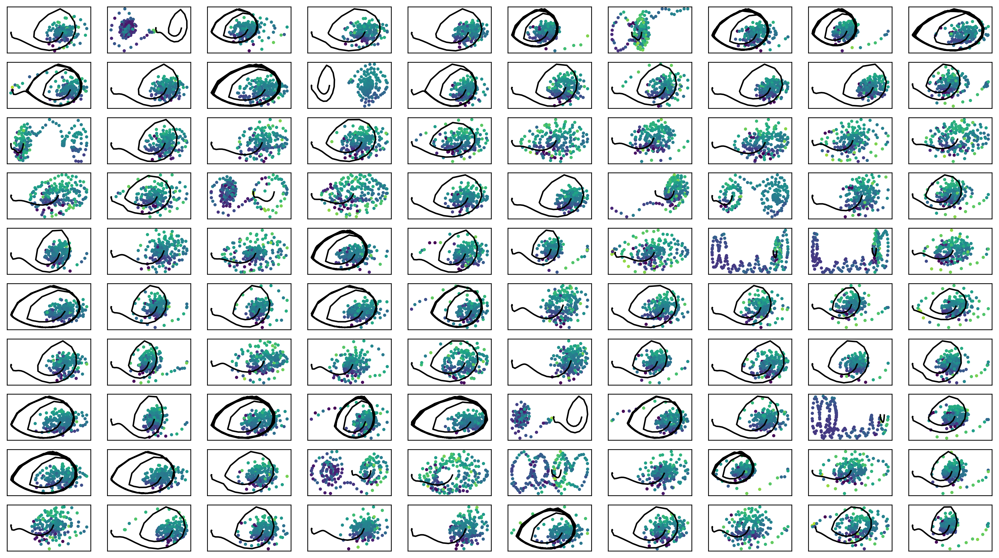

In [23]:
fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter2.png")

In [24]:

train_curve1, valid_curve1 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()

# train_curve2, valid_curve2 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=2)
# iwvi.update_mulogvar_offlinedata()

# train_curve3, valid_curve3 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=3)
# iwvi.update_mulogvar_offlinedata()



weight_alpha 0.1
train_weighted_vae: enc_dec
train: iter 0  trainloss -371.22123  validloss -349.54827±0.00000  bestvalidloss -349.54827  last_update 0
train: iter 1  trainloss -375.25958  validloss -362.17820±0.00000  bestvalidloss -362.17820  last_update 0
train: iter 2  trainloss -369.50395  validloss -367.35439±0.00000  bestvalidloss -367.35439  last_update 0
train: iter 3  trainloss -373.48644  validloss -345.42499±0.00000  bestvalidloss -367.35439  last_update 1
train: iter 4  trainloss -370.86663  validloss -362.65618±0.00000  bestvalidloss -367.35439  last_update 2
train: iter 5  trainloss -359.50270  validloss -364.12535±0.00000  bestvalidloss -367.35439  last_update 3
train: iter 6  trainloss -371.61600  validloss -363.42911±0.00000  bestvalidloss -367.35439  last_update 4
train: iter 7  trainloss -369.24329  validloss -371.19231±0.00000  bestvalidloss -371.19231  last_update 0
train: iter 8  trainloss -366.73342  validloss -369.26710±0.00000  bestvalidloss -371.19231  last_u

train: iter 76  trainloss -379.90206  validloss -372.02820±0.00000  bestvalidloss -389.56593  last_update 4
train: iter 77  trainloss -379.21586  validloss -362.36127±0.00000  bestvalidloss -389.56593  last_update 5
train: iter 78  trainloss -377.39248  validloss -366.19797±0.00000  bestvalidloss -389.56593  last_update 6
train: iter 79  trainloss -379.94121  validloss -369.57321±0.00000  bestvalidloss -389.56593  last_update 7
train: iter 80  trainloss -379.49619  validloss -392.08495±0.00000  bestvalidloss -392.08495  last_update 0
train: iter 81  trainloss -380.21883  validloss -376.85347±0.00000  bestvalidloss -392.08495  last_update 1
train: iter 82  trainloss -374.28485  validloss -365.71693±0.00000  bestvalidloss -392.08495  last_update 2
train: iter 83  trainloss -372.93841  validloss -328.42065±0.00000  bestvalidloss -392.08495  last_update 3
train: iter 84  trainloss -379.58322  validloss -387.15078±0.00000  bestvalidloss -392.08495  last_update 4
train: iter 85  trainloss -3

train: iter 152  trainloss -373.91742  validloss -370.40725±0.00000  bestvalidloss -400.84690  last_update 26
train: iter 153  trainloss -386.48764  validloss -383.56123±0.00000  bestvalidloss -400.84690  last_update 27
train: iter 154  trainloss -374.00272  validloss -344.63978±0.00000  bestvalidloss -400.84690  last_update 28
train: iter 155  trainloss -381.79165  validloss -384.44197±0.00000  bestvalidloss -400.84690  last_update 29
train: iter 156  trainloss -378.97765  validloss -385.19408±0.00000  bestvalidloss -400.84690  last_update 30
train: iter 157  trainloss -386.76920  validloss -380.88258±0.00000  bestvalidloss -400.84690  last_update 31
train: iter 158  trainloss -375.94909  validloss -398.51829±0.00000  bestvalidloss -400.84690  last_update 32
train: iter 159  trainloss -372.72427  validloss -374.81340±0.00000  bestvalidloss -400.84690  last_update 33
train: iter 160  trainloss -376.98528  validloss -384.30531±0.00000  bestvalidloss -400.84690  last_update 34
train: ite

train: iter 227  trainloss -386.27872  validloss -386.13421±0.00000  bestvalidloss -402.56513  last_update 14
train: iter 228  trainloss -384.16858  validloss -395.70991±0.00000  bestvalidloss -402.56513  last_update 15
train: iter 229  trainloss -384.44319  validloss -373.18461±0.00000  bestvalidloss -402.56513  last_update 16
train: iter 230  trainloss -383.45033  validloss -397.78299±0.00000  bestvalidloss -402.56513  last_update 17
train: iter 231  trainloss -387.52606  validloss -381.89326±0.00000  bestvalidloss -402.56513  last_update 18
train: iter 232  trainloss -386.80609  validloss -379.06685±0.00000  bestvalidloss -402.56513  last_update 19
train: iter 233  trainloss -391.32516  validloss -393.97246±0.00000  bestvalidloss -402.56513  last_update 20
train: iter 234  trainloss -386.95739  validloss -378.68124±0.00000  bestvalidloss -402.56513  last_update 21
train: iter 235  trainloss -384.08701  validloss -359.40807±0.00000  bestvalidloss -402.56513  last_update 22
train: ite

train: iter 302  trainloss -391.06289  validloss -387.22798±0.00000  bestvalidloss -406.26402  last_update 58
train: iter 303  trainloss -391.77700  validloss -387.10554±0.00000  bestvalidloss -406.26402  last_update 59
train: iter 304  trainloss -378.14529  validloss -389.52857±0.00000  bestvalidloss -406.26402  last_update 60
train: iter 305  trainloss -385.47347  validloss -396.12905±0.00000  bestvalidloss -406.26402  last_update 61
train: iter 306  trainloss -390.59355  validloss -393.69480±0.00000  bestvalidloss -406.26402  last_update 62
train: iter 307  trainloss -389.16117  validloss -393.39506±0.00000  bestvalidloss -406.26402  last_update 63
train: iter 308  trainloss -391.15455  validloss -401.23063±0.00000  bestvalidloss -406.26402  last_update 64
train: iter 309  trainloss -384.96398  validloss -392.98990±0.00000  bestvalidloss -406.26402  last_update 65
train: iter 310  trainloss -391.72485  validloss -396.54864±0.00000  bestvalidloss -406.26402  last_update 66
train: ite

train: iter 377  trainloss -392.30125  validloss -400.31831±0.00000  bestvalidloss -411.42615  last_update 43
train: iter 378  trainloss -393.16881  validloss -399.81826±0.00000  bestvalidloss -411.42615  last_update 44
train: iter 379  trainloss -392.79721  validloss -388.84934±0.00000  bestvalidloss -411.42615  last_update 45
train: iter 380  trainloss -390.29086  validloss -407.10152±0.00000  bestvalidloss -411.42615  last_update 46
train: iter 381  trainloss -393.55779  validloss -400.68878±0.00000  bestvalidloss -411.42615  last_update 47
train: iter 382  trainloss -392.95528  validloss -392.70980±0.00000  bestvalidloss -411.42615  last_update 48
train: iter 383  trainloss -390.74210  validloss -401.23112±0.00000  bestvalidloss -411.42615  last_update 49
train: iter 384  trainloss -396.04786  validloss -394.15915±0.00000  bestvalidloss -411.42615  last_update 50
train: iter 385  trainloss -393.64688  validloss -386.19426±0.00000  bestvalidloss -411.42615  last_update 51
train: ite

train: iter 452  trainloss -393.01378  validloss -391.31367±0.00000  bestvalidloss -413.07968  last_update 12
train: iter 453  trainloss -393.17176  validloss -380.88407±0.00000  bestvalidloss -413.07968  last_update 13
train: iter 454  trainloss -389.92984  validloss -376.47463±0.00000  bestvalidloss -413.07968  last_update 14
train: iter 455  trainloss -392.92339  validloss -410.69369±0.00000  bestvalidloss -413.07968  last_update 15
train: iter 456  trainloss -396.21202  validloss -401.06225±0.00000  bestvalidloss -413.07968  last_update 16
train: iter 457  trainloss -397.54643  validloss -407.27138±0.00000  bestvalidloss -413.07968  last_update 17
train: iter 458  trainloss -387.63053  validloss -383.90824±0.00000  bestvalidloss -413.07968  last_update 18
train: iter 459  trainloss -390.19217  validloss -381.83126±0.00000  bestvalidloss -413.07968  last_update 19
train: iter 460  trainloss -395.58063  validloss -403.65987±0.00000  bestvalidloss -413.07968  last_update 20
train: ite

train: iter 527  trainloss -400.72357  validloss -403.74518±0.00000  bestvalidloss -420.20636  last_update 7
train: iter 528  trainloss -399.16535  validloss -409.98319±0.00000  bestvalidloss -420.20636  last_update 8
train: iter 529  trainloss -393.98034  validloss -398.09254±0.00000  bestvalidloss -420.20636  last_update 9
train: iter 530  trainloss -396.52605  validloss -393.44416±0.00000  bestvalidloss -420.20636  last_update 10
train: iter 531  trainloss -396.48879  validloss -405.07654±0.00000  bestvalidloss -420.20636  last_update 11
train: iter 532  trainloss -398.49725  validloss -415.35078±0.00000  bestvalidloss -420.20636  last_update 12
train: iter 533  trainloss -397.81764  validloss -409.74568±0.00000  bestvalidloss -420.20636  last_update 13
train: iter 534  trainloss -396.32421  validloss -410.62553±0.00000  bestvalidloss -420.20636  last_update 14
train: iter 535  trainloss -401.06515  validloss -392.18979±0.00000  bestvalidloss -420.20636  last_update 15
train: iter 5

train: iter 602  trainloss -400.87704  validloss -415.43448±0.00000  bestvalidloss -423.74322  last_update 3
train: iter 603  trainloss -402.56598  validloss -390.30799±0.00000  bestvalidloss -423.74322  last_update 4
train: iter 604  trainloss -399.19589  validloss -383.04293±0.00000  bestvalidloss -423.74322  last_update 5
train: iter 605  trainloss -398.73406  validloss -414.40418±0.00000  bestvalidloss -423.74322  last_update 6
train: iter 606  trainloss -404.79284  validloss -403.59087±0.00000  bestvalidloss -423.74322  last_update 7
train: iter 607  trainloss -397.98198  validloss -405.43368±0.00000  bestvalidloss -423.74322  last_update 8
train: iter 608  trainloss -403.00541  validloss -417.34140±0.00000  bestvalidloss -423.74322  last_update 9
train: iter 609  trainloss -402.56680  validloss -407.57958±0.00000  bestvalidloss -423.74322  last_update 10
train: iter 610  trainloss -403.53260  validloss -425.69716±0.00000  bestvalidloss -425.69716  last_update 0
train: iter 611  t

train: iter 677  trainloss -422.49423  validloss -435.67036±0.00000  bestvalidloss -435.67036  last_update 0
train: iter 678  trainloss -422.67362  validloss -422.10064±0.00000  bestvalidloss -435.67036  last_update 1
train: iter 679  trainloss -412.71836  validloss -434.91426±0.00000  bestvalidloss -435.67036  last_update 2
train: iter 680  trainloss -426.73047  validloss -424.34797±0.00000  bestvalidloss -435.67036  last_update 3
train: iter 681  trainloss -405.94610  validloss -398.22726±0.00000  bestvalidloss -435.67036  last_update 4
train: iter 682  trainloss -415.68098  validloss -388.84803±0.00000  bestvalidloss -435.67036  last_update 5
train: iter 683  trainloss -418.99022  validloss -426.73091±0.00000  bestvalidloss -435.67036  last_update 6
train: iter 684  trainloss -416.93917  validloss -419.68823±0.00000  bestvalidloss -435.67036  last_update 7
train: iter 685  trainloss -423.11133  validloss -433.46396±0.00000  bestvalidloss -435.67036  last_update 8
train: iter 686  tr

train: iter 752  trainloss -447.19881  validloss -410.67916±0.00000  bestvalidloss -450.54516  last_update 9
train: iter 753  trainloss -448.41964  validloss -393.09845±0.00000  bestvalidloss -450.54516  last_update 10
train: iter 754  trainloss -445.63940  validloss -424.62189±0.00000  bestvalidloss -450.54516  last_update 11
train: iter 755  trainloss -454.08531  validloss -437.20763±0.00000  bestvalidloss -450.54516  last_update 12
train: iter 756  trainloss -453.99752  validloss -425.50873±0.00000  bestvalidloss -450.54516  last_update 13
train: iter 757  trainloss -437.94234  validloss -401.40234±0.00000  bestvalidloss -450.54516  last_update 14
train: iter 758  trainloss -451.53658  validloss -386.20981±0.00000  bestvalidloss -450.54516  last_update 15
train: iter 759  trainloss -443.58863  validloss -408.54263±0.00000  bestvalidloss -450.54516  last_update 16
train: iter 760  trainloss -451.69652  validloss -416.91244±0.00000  bestvalidloss -450.54516  last_update 17
train: iter

train: iter 827  trainloss -451.12001  validloss -442.65061±0.00000  bestvalidloss -460.50487  last_update 13
train: iter 828  trainloss -462.51035  validloss -419.08078±0.00000  bestvalidloss -460.50487  last_update 14
train: iter 829  trainloss -465.52434  validloss -405.56499±0.00000  bestvalidloss -460.50487  last_update 15
train: iter 830  trainloss -466.90047  validloss -432.13404±0.00000  bestvalidloss -460.50487  last_update 16
train: iter 831  trainloss -464.46440  validloss -427.71869±0.00000  bestvalidloss -460.50487  last_update 17
train: iter 832  trainloss -467.49534  validloss -427.43204±0.00000  bestvalidloss -460.50487  last_update 18
train: iter 833  trainloss -467.04671  validloss -428.87338±0.00000  bestvalidloss -460.50487  last_update 19
train: iter 834  trainloss -455.70721  validloss -398.09305±0.00000  bestvalidloss -460.50487  last_update 20
train: iter 835  trainloss -445.43421  validloss -426.36108±0.00000  bestvalidloss -460.50487  last_update 21
train: ite

train: iter 902  trainloss -458.10201  validloss -421.20448±0.00000  bestvalidloss -460.50487  last_update 88
train: iter 903  trainloss -478.37379  validloss -460.85729±0.00000  bestvalidloss -460.85729  last_update 0
train: iter 904  trainloss -466.82595  validloss -397.68572±0.00000  bestvalidloss -460.85729  last_update 1
train: iter 905  trainloss -451.67841  validloss -374.70568±0.00000  bestvalidloss -460.85729  last_update 2
train: iter 906  trainloss -478.96162  validloss -448.60169±0.00000  bestvalidloss -460.85729  last_update 3
train: iter 907  trainloss -474.08063  validloss -359.37852±0.00000  bestvalidloss -460.85729  last_update 4
train: iter 908  trainloss -486.34302  validloss -444.43357±0.00000  bestvalidloss -460.85729  last_update 5
train: iter 909  trainloss -471.21639  validloss -453.31647±0.00000  bestvalidloss -460.85729  last_update 6
train: iter 910  trainloss -480.38104  validloss -413.28353±0.00000  bestvalidloss -460.85729  last_update 7
train: iter 911  t

train: iter 977  trainloss -487.57338  validloss -469.43547±0.00000  bestvalidloss -471.30175  last_update 59
train: iter 978  trainloss -479.74876  validloss -430.10511±0.00000  bestvalidloss -471.30175  last_update 60
train: iter 979  trainloss -482.12842  validloss -423.24296±0.00000  bestvalidloss -471.30175  last_update 61
train: iter 980  trainloss -481.80775  validloss -415.80033±0.00000  bestvalidloss -471.30175  last_update 62
train: iter 981  trainloss -484.17952  validloss -352.41537±0.00000  bestvalidloss -471.30175  last_update 63
train: iter 982  trainloss -483.52031  validloss -447.85569±0.00000  bestvalidloss -471.30175  last_update 64
train: iter 983  trainloss -488.49606  validloss -391.52742±0.00000  bestvalidloss -471.30175  last_update 65
train: iter 984  trainloss -488.40104  validloss -430.36885±0.00000  bestvalidloss -471.30175  last_update 66
train: iter 985  trainloss -491.07774  validloss -423.29876±0.00000  bestvalidloss -471.30175  last_update 67
train: ite

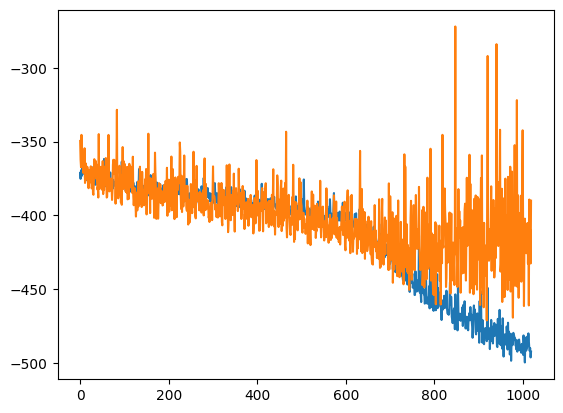

alpha 0.1 default_lr 0.0005


In [25]:
plt.plot(train_curve1)
plt.plot(valid_curve1)
plt.show()

# plt.plot(train_curve2)
# plt.plot(valid_curve2)
# plt.show()

# plt.plot(train_curve3)
# plt.plot(valid_curve3)
# plt.show()
print("alpha",alpha, "default_lr", default_lr)

In [26]:
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)



0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56

実環境方策rollout vs Sim環境方策rollout


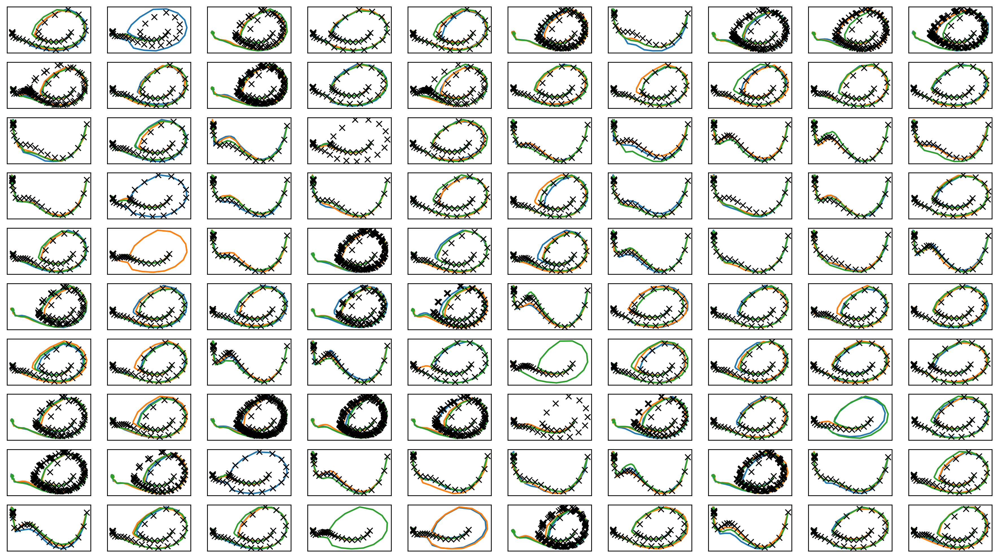

In [27]:
fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
    ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 
#     ax_list[-1].plot(simdata0d[i][:,0], simdata0d[i][:,1]) 
#     ax_list[-1].plot(simdata0e[i][:,0], simdata0e[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter2.png")
plt.savefig(figfilenamehead+"joint_iter2.eps")
# plt.savefig(figfilenamehead+"joint_iter2.pdf")

print("実環境方策rollout vs Sim環境方策rollout")

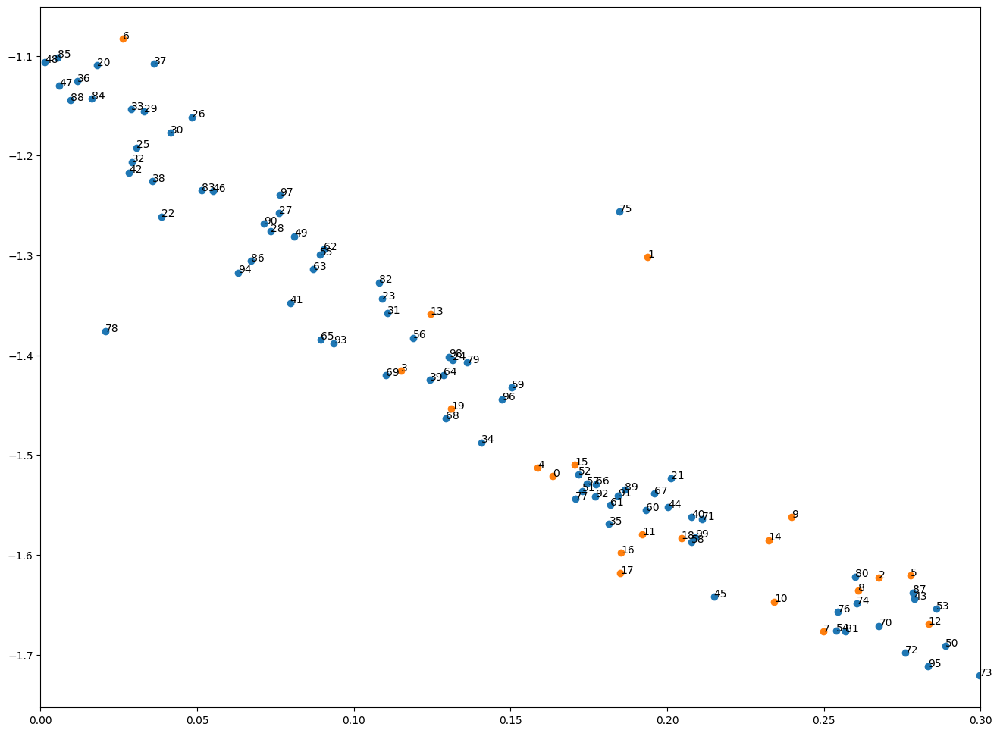

[0.16346495 0.19376823 0.2675319  0.11503246 0.15866848 0.27767899
 0.02613879 0.24978595 0.26100364 0.23974757]
[0.23415875 0.19197631 0.28340068 0.12439858 0.23227011 0.17053018
 0.18529065 0.1850802  0.20454609 0.13110959]
[0.01806764 0.20119136 0.03867789 0.10911323 0.13158045 0.03061344
 0.04839286 0.07598748 0.07332768 0.03311254]
[0.04145489 0.11061755 0.02913038 0.02882952 0.14059536 0.18145366
 0.01175634 0.03605897 0.03561832 0.1242789 ]
[0.20774164 0.07961685 0.02818215 0.27878886 0.20022311 0.21489816
 0.05495741 0.00603226 0.00140864 0.08100239]
[0.28865656 0.1728472  0.17167557 0.2858247  0.2539226  0.08923109
 0.11895172 0.17438186 0.20775948 0.15039731]
[0.19319706 0.18191796 0.09047245 0.08702328 0.12863061 0.0894847
 0.17726183 0.19596025 0.12942553 0.11026856]
[0.26757701 0.21116658 0.27584478 0.2996541  0.26043782 0.18466787
 0.25440247 0.17073022 0.0207501  0.1360628 ]
[0.2599147  0.256741   0.10799342 0.0514889  0.0163014  0.00555654
 0.06717741 0.27842439 0.00955

In [28]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter2.png")
plt.savefig(figfilenamehead+"damping_latent_iter2.eps")
# plt.savefig(figfilenamehead+"damping_latent_iter2.pdf")
plt.show()



for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [29]:
print(datetime.datetime.now())

2023-06-07 08:44:51.071035


# Iter 3

In [30]:
iwvi.get_sim_rollout_mdppolicy_data_randomstop()

0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   


In [31]:
iwvi.train_ratio(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, policy=agent.select_action)


train: iter 0  trainloss 0.17128  validloss 0.17146±0.00000  bestvalidloss 0.17146  last_update 0
train: iter 1  trainloss 0.15953  validloss 0.12641±0.00000  bestvalidloss 0.12641  last_update 0
train: iter 2  trainloss 0.15589  validloss 0.12558±0.00000  bestvalidloss 0.12558  last_update 0
train: iter 3  trainloss 0.15268  validloss 0.12101±0.00000  bestvalidloss 0.12101  last_update 0
train: iter 4  trainloss 0.15045  validloss 0.11794±0.00000  bestvalidloss 0.11794  last_update 0
train: iter 5  trainloss 0.15029  validloss 0.12037±0.00000  bestvalidloss 0.11794  last_update 1
train: iter 6  trainloss 0.14924  validloss 0.11742±0.00000  bestvalidloss 0.11742  last_update 0
train: iter 7  trainloss 0.14978  validloss 0.11563±0.00000  bestvalidloss 0.11563  last_update 0
train: iter 8  trainloss 0.14838  validloss 0.11503±0.00000  bestvalidloss 0.11503  last_update 0
train: iter 9  trainloss 0.14616  validloss 0.11368±0.00000  bestvalidloss 0.11368  last_update 0
train: iter 10  trai

train: iter 83  trainloss 0.13775  validloss 0.10508±0.00000  bestvalidloss 0.10465  last_update 4
train: iter 84  trainloss 0.13723  validloss 0.11202±0.00000  bestvalidloss 0.10465  last_update 5
train: iter 85  trainloss 0.13723  validloss 0.10811±0.00000  bestvalidloss 0.10465  last_update 6
train: iter 86  trainloss 0.13674  validloss 0.10573±0.00000  bestvalidloss 0.10465  last_update 7
train: iter 87  trainloss 0.13803  validloss 0.10780±0.00000  bestvalidloss 0.10465  last_update 8
train: iter 88  trainloss 0.13867  validloss 0.10535±0.00000  bestvalidloss 0.10465  last_update 9
train: iter 89  trainloss 0.13678  validloss 0.10556±0.00000  bestvalidloss 0.10465  last_update 10
train: iter 90  trainloss 0.13688  validloss 0.10698±0.00000  bestvalidloss 0.10465  last_update 11
train: iter 91  trainloss 0.13709  validloss 0.10563±0.00000  bestvalidloss 0.10465  last_update 12
train: iter 92  trainloss 0.13547  validloss 0.10477±0.00000  bestvalidloss 0.10465  last_update 13
train:

train: iter 165  trainloss 0.13285  validloss 0.10912±0.00000  bestvalidloss 0.10265  last_update 19
train: iter 166  trainloss 0.13261  validloss 0.10668±0.00000  bestvalidloss 0.10265  last_update 20
train: iter 167  trainloss 0.13214  validloss 0.10920±0.00000  bestvalidloss 0.10265  last_update 21
train: iter 168  trainloss 0.13105  validloss 0.10559±0.00000  bestvalidloss 0.10265  last_update 22
train: iter 169  trainloss 0.13137  validloss 0.10244±0.00000  bestvalidloss 0.10244  last_update 0
train: iter 170  trainloss 0.13222  validloss 0.10535±0.00000  bestvalidloss 0.10244  last_update 1
train: iter 171  trainloss 0.13361  validloss 0.10616±0.00000  bestvalidloss 0.10244  last_update 2
train: iter 172  trainloss 0.13159  validloss 0.10307±0.00000  bestvalidloss 0.10244  last_update 3
train: iter 173  trainloss 0.13351  validloss 0.10481±0.00000  bestvalidloss 0.10244  last_update 4
train: iter 174  trainloss 0.13031  validloss 0.10652±0.00000  bestvalidloss 0.10244  last_updat

train: iter 247  trainloss 0.12756  validloss 0.10468±0.00000  bestvalidloss 0.10146  last_update 16
train: iter 248  trainloss 0.12828  validloss 0.10314±0.00000  bestvalidloss 0.10146  last_update 17
train: iter 249  trainloss 0.12775  validloss 0.10129±0.00000  bestvalidloss 0.10129  last_update 0
train: iter 250  trainloss 0.12771  validloss 0.10181±0.00000  bestvalidloss 0.10129  last_update 1
train: iter 251  trainloss 0.12874  validloss 0.10430±0.00000  bestvalidloss 0.10129  last_update 2
train: iter 252  trainloss 0.12908  validloss 0.10231±0.00000  bestvalidloss 0.10129  last_update 3
train: iter 253  trainloss 0.12894  validloss 0.10202±0.00000  bestvalidloss 0.10129  last_update 4
train: iter 254  trainloss 0.12813  validloss 0.10335±0.00000  bestvalidloss 0.10129  last_update 5
train: iter 255  trainloss 0.12760  validloss 0.10355±0.00000  bestvalidloss 0.10129  last_update 6
train: iter 256  trainloss 0.12792  validloss 0.10702±0.00000  bestvalidloss 0.10129  last_update 

train: iter 329  trainloss 0.12487  validloss 0.10504±0.00000  bestvalidloss 0.10072  last_update 49
train: iter 330  trainloss 0.12640  validloss 0.10420±0.00000  bestvalidloss 0.10072  last_update 50
train: iter 331  trainloss 0.12551  validloss 0.10221±0.00000  bestvalidloss 0.10072  last_update 51
train: iter 332  trainloss 0.12556  validloss 0.10170±0.00000  bestvalidloss 0.10072  last_update 52
train: iter 333  trainloss 0.12643  validloss 0.10529±0.00000  bestvalidloss 0.10072  last_update 53
train: iter 334  trainloss 0.12569  validloss 0.10089±0.00000  bestvalidloss 0.10072  last_update 54
train: iter 335  trainloss 0.12465  validloss 0.10541±0.00000  bestvalidloss 0.10072  last_update 55
train: iter 336  trainloss 0.12623  validloss 0.10133±0.00000  bestvalidloss 0.10072  last_update 56
train: iter 337  trainloss 0.12673  validloss 0.10164±0.00000  bestvalidloss 0.10072  last_update 57
train: iter 338  trainloss 0.12487  validloss 0.10350±0.00000  bestvalidloss 0.10072  last_

train: iter 411  trainloss 0.12307  validloss 0.10200±0.00000  bestvalidloss 0.10000  last_update 9
train: iter 412  trainloss 0.12346  validloss 0.10023±0.00000  bestvalidloss 0.10000  last_update 10
train: iter 413  trainloss 0.12448  validloss 0.10088±0.00000  bestvalidloss 0.10000  last_update 11
train: iter 414  trainloss 0.12413  validloss 0.10068±0.00000  bestvalidloss 0.10000  last_update 12
train: iter 415  trainloss 0.12326  validloss 0.10025±0.00000  bestvalidloss 0.10000  last_update 13
train: iter 416  trainloss 0.12388  validloss 0.10074±0.00000  bestvalidloss 0.10000  last_update 14
train: iter 417  trainloss 0.12274  validloss 0.10842±0.00000  bestvalidloss 0.10000  last_update 15
train: iter 418  trainloss 0.12344  validloss 0.10435±0.00000  bestvalidloss 0.10000  last_update 16
train: iter 419  trainloss 0.12331  validloss 0.10285±0.00000  bestvalidloss 0.10000  last_update 17
train: iter 420  trainloss 0.12356  validloss 0.10191±0.00000  bestvalidloss 0.10000  last_u

In [32]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))
# print(loss_list)
# print(normalized_loss_list)

In [33]:
fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter3.png")

In [34]:

train_curve1, valid_curve1 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()

# train_curve2, valid_curve2 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=2)
# iwvi.update_mulogvar_offlinedata()

# train_curve3, valid_curve3 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=3)
# iwvi.update_mulogvar_offlinedata()



In [35]:
plt.plot(train_curve1)
plt.plot(valid_curve1)
plt.show()

# plt.plot(train_curve2)
# plt.plot(valid_curve2)
# plt.show()

# plt.plot(train_curve3)
# plt.plot(valid_curve3)
# plt.show()
print("alpha",alpha, "default_lr", default_lr)

In [36]:
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)


In [37]:

fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
    ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 
#     ax_list[-1].plot(simdata0d[i][:,0], simdata0d[i][:,1]) 
#     ax_list[-1].plot(simdata0e[i][:,0], simdata0e[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter3.png")
plt.savefig(figfilenamehead+"joint_iter3.eps")
# plt.savefig(figfilenamehead+"joint_iter3.pdf")

print("実環境方策rollout vs Sim環境方策rollout")

In [38]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter3.png")
plt.savefig(figfilenamehead+"damping_latent_iter3.eps")
# plt.savefig(figfilenamehead+"damping_latent_iter3.pdf")
plt.show()



for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [39]:
print(datetime.datetime.now())

# 評価関数計算

In [40]:
iwvi.get_sim_rollout_mdppolicy_data_randomstop()

In [41]:
iwvi.train_ratio(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, policy=agent.select_action)
# iwvi.save()
# plt.plot(train_curve)
# plt.plot(valid_curve)

In [42]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))
print(loss_list)
print(normalized_loss_list)

In [43]:
train_curve, valid_curve = iwvi.train_initial_belief(num_iter=100000, lr=1e-3, early_stop_step=default_early)


In [44]:
print(iwvi.initial_belief)


In [45]:
train_curve, valid_curve = iwvi.train_penalty(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early)

In [46]:
plt.plot(train_curve)
plt.plot(valid_curve)

In [47]:
iwvi.save(ckpt_key="policy_evaluation")

In [48]:
loss_array = np.array(loss_list)
print(loss_array)

In [49]:
plt.figure(figsize=(16,12))
plt.plot(loss_array[:,0])
plt.plot(loss_array[:,1])
plt.xlabel("iteration")
plt.ylabel("loss")
plt.savefig(figfilenamehead+"learning_curve.png")
plt.savefig(figfilenamehead+"learning_curve.eps")
# plt.savefig(figfilenamehead+"policy_evaluartion_learning_curve.pdf")

In [50]:
normalized_loss_array = np.array(normalized_loss_list)
plt.figure(figsize=(16,12))
plt.plot(normalized_loss_array[:,0])
plt.plot(normalized_loss_array[:,1])
plt.xlabel("iteration")
plt.ylabel("loss")
plt.savefig(figfilenamehead+"learning_curve_normalized_"+env_str+".png")
plt.savefig(figfilenamehead+"learning_curve_normalized_"+env_str+".eps")
# plt.savefig(figfilenamehead+"policy_evaluartion_learning_curve_normalized_"+env_str+".pdf")

In [51]:
print(iwvi.dec.state_dict()['net_phat.0.weight'].sum())